## Подготовка данных


In [ ]:
!pip install gdown

In [ ]:
!gdown https://drive.google.com/uc?id=1dTfu1xq671ZRZgOlshomJ9PpuDYafNP4

Downloading...
From: https://drive.google.com/uc?id=1dTfu1xq671ZRZgOlshomJ9PpuDYafNP4
To: /content/data_scene_flow.zip
100% 1.68G/1.68G [00:10<00:00, 161MB/s]


In [ ]:
!mkdir -p data/kitti_2015

In [ ]:
!unzip -q data_scene_flow.zip -d data/kitti_2015

In [ ]:
!sudo apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 0s (122 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 155229 files and directories currently install

In [ ]:
!tree data --filelimit 20

data
└── kitti_2015
    ├── testing
    │   ├── image_2 [400 entries exceeds filelimit, not opening dir]
    │   └── image_3 [400 entries exceeds filelimit, not opening dir]
    └── training
        ├── disp_noc_0 [200 entries exceeds filelimit, not opening dir]
        ├── disp_noc_1 [200 entries exceeds filelimit, not opening dir]
        ├── disp_occ_0 [200 entries exceeds filelimit, not opening dir]
        ├── disp_occ_1 [200 entries exceeds filelimit, not opening dir]
        ├── flow_noc [200 entries exceeds filelimit, not opening dir]
        ├── flow_occ [200 entries exceeds filelimit, not opening dir]
        ├── image_2 [400 entries exceeds filelimit, not opening dir]
        ├── image_3 [400 entries exceeds filelimit, not opening dir]
        ├── obj_map [200 entries exceeds filelimit, not opening dir]
        ├── viz_flow_occ [200 entries exceeds filelimit, not opening dir]
        └── viz_flow_occ_dilate_1 [200 entries exceeds filelimit, not opening dir]

16 directories, 

In [ ]:
from glob import glob
from pathlib import Path
import os

import numpy as np
import cv2
from skimage.io import imread

import torch
import torch.utils.data as data  # dataset shuffling, sample batching, ...
from torch import nn  # neural network layers
import torchvision.transforms as T  # augmentation

import matplotlib.pyplot as plt
import pickle # Save/load patch locations.

# Load the TensorBoard notebook extension
%load_ext tensorboard

## Датасет

Прежде всего необходимо подготовить данные для обучения. В этом задании мы будем использовать датасет kitti 2015.

Начнем с указания расположения и параметров датасета.

In [ ]:
class Settings:
    def __init__(self, data_folder_path, phase, dataset_name="kitti_2015"):
        self.left_img_folder = "image_2"
        self.right_img_folder = "image_3"
        self.disparity_folder = "disp_noc_0"
        self.disparity_range = 257 # 0 to 256 inclusive.
        self.num_input_channels = 3

        self.phase = phase
        self.patch_size = 37
        self.data_path = os.path.join(data_folder_path, dataset_name, phase)
        self.out_cache_path = os.path.join("cache", dataset_name, phase)
        self.img_height = 370
        self.img_width = 1224
        self.half_patch_size = self.patch_size // 2
        self.half_disp_range = self.disparity_range // 2

train_settings = Settings("data", "training")

Определим пути к изображениям, на которых будем обучать и тестировать модель.

In [ ]:
def load_image_paths(data_path, left_img_folder, right_img_folder,
                     disparity_folder):
    left_image_paths = sorted(glob(os.path.join(data_path, left_img_folder, '*10.png')))
    right_image_paths = sorted(glob(os.path.join(data_path, right_img_folder, '*10.png')))
    disparity_image_paths = sorted(glob(os.path.join(data_path, disparity_folder, '*10.png')))

    return left_image_paths, right_image_paths, disparity_image_paths

left_image_paths, right_image_paths, disparity_image_paths = \
    load_image_paths(train_settings.data_path, train_settings.left_img_folder,
        train_settings.right_img_folder, train_settings.disparity_folder)

Обратите внимание, что диспаритет представлен не во всех пикселях. Это нужно будет учитывать при нахождении примеров для обучения и при подсчете ошибок.

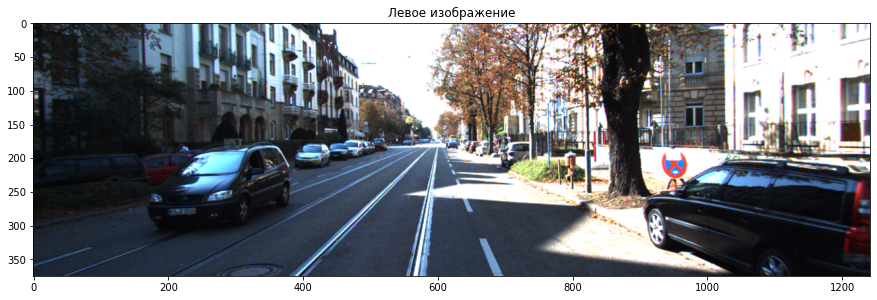

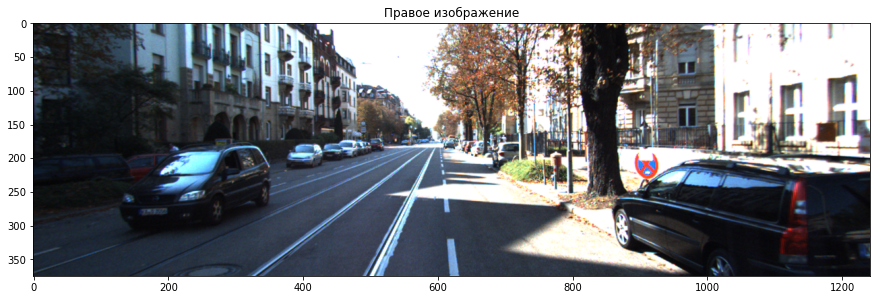

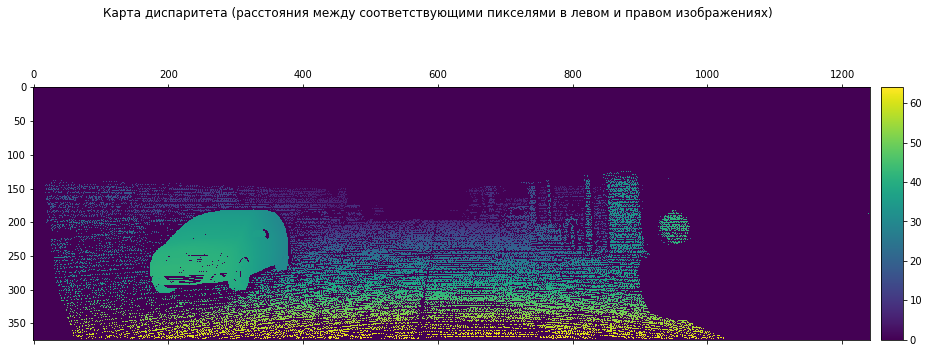

In [ ]:
def display_example_images(idx):
    left_img = imread(left_image_paths[idx])
    right_img = imread(right_image_paths[idx])
    disp_img = imread(disparity_image_paths[idx], as_gray=True) / 256.0

    plt.figure(figsize=(15, 15))
    plt.title("Левое изображение")
    plt.imshow(left_img)
    plt.show()

    plt.figure(figsize=(15, 15))
    plt.title("Правое изображение")
    plt.imshow(right_img)
    plt.show()

    fig = plt.figure(figsize=(15, 6))
    fig.suptitle("Карта диспаритета (расстояния между соответствующими пикселями в левом и правом изображениях)")
    ax = plt.axes()
    im = ax.matshow(disp_img)
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    plt.colorbar(im, cax=cax)
    plt.show()

display_example_images(0)

### Выделение пар патчей, на которых будет обучаться модель

Модель будет обучаться на парах патчей из левого и правого изображений. Из левого берется квадратный кусок $S*S$, а из правого полоса с выосотой $S$ (в нашем случае 37) и шириной $W_{strip}+S$, где $W_{strip}$ равно числу возможных значений диспаритета (в нашем случае их 257 - [0, 256]). На выходе модели при обучении будет вектор из $W_{strip}$ значений, представляющий степень соответствия патча из левой картинки каждому его смещению в полосе из правой. Для обучения мы будем вырезать полосу из правого изображения так, чтобы наибольшее соответствие получалось в центре. Поэтому центр полосы должен быть смещен относительно центра патча на значение диспаритета в нем.

Поскольку эталонные карты диспаритета лишь частично заполнены, нам нужно сначала определить, в каких пикселях он есть, и только там вырезать патчи для обучения. Кроме этого, мы будем брать только те пары патч-полоса, которые полностью находятся внутри левого и правого изображений (т. е. не заходят за границы).

**Задание 1**.

Напишите функцию compute_image_valid_locations(), которая будет по карте диспаритета выделять координаты (в пикселях) подходящих пар патч-полоса. Она должна возвращать 3 массива одинаковой длины: left_center_x_col - x-координаты центров патчей в левом изображении, left_center_y_col - y-координаты центров патчей в левом изображении (они же y-координаты центров полос из правого изображения), right_center_x_col - x-координаты центров полос в правом изображении.

In [ ]:
def compute_image_valid_locations(disp_img, half_patch_size, half_disp_range):
    """
    Computes valid locations of patch pairs for a specific disparity image.

    Args:
        disp_img : 2D array - disparity map (have float values transformed to [0, disp_range] range).
        half_patch_size : int - half patch size. Patch size is half_patch_size * 2 + 1.
        half_disp_range : int - half disparity range. Disparity range is half_disp_range * 2 + 1.

    Returns:
        Tuple (left_center_x_col, left_center_y_col, right_center_x_col).
    """
    # your code here
    # vvvvvvvvvvvvvv

    # Подсказка: для нахождения координат ненулевого диспаритета можно использовать np.where.

    disp_img = disp_img[half_patch_size : -half_patch_size, half_patch_size : -half_patch_size]

    where_disp_exists = np.where(disp_img != 0)
    potential_centers_left = np.stack(where_disp_exists, axis=1)
    potential_centers_right_x = (potential_centers_left[:, 1] - disp_img[where_disp_exists]).round().astype("int32")

    where_valid_locations = (potential_centers_right_x - half_disp_range >= 0) * \
        (potential_centers_right_x + half_disp_range < disp_img.shape[1])

    left_center_x_col = potential_centers_left[where_valid_locations, 1] + half_patch_size
    left_center_y_col = potential_centers_left[where_valid_locations, 0] + half_patch_size
    right_center_x_col = potential_centers_right_x[where_valid_locations] + half_patch_size
    return left_center_x_col, left_center_y_col, right_center_x_col

    # ^^^^^^^^^^^^^^

Здесь можно протестировать работу функции.

In [ ]:
def trim_expand_image(img, img_height, img_width):
    trimmed = img[0:img_height, 0:img_width]
    result = np.zeros([img_height, img_width] + list(img.shape[2:]), dtype=img.dtype)
    result[:trimmed.shape[0], :trimmed.shape[1]] = trimmed
    return result

def test_compute_image_valid_locations():
    img_height = train_settings.img_height
    img_width = train_settings.img_width
    disp_img = np.array(imread(disparity_image_paths[42])).astype("float64") / 256
    disp_img = trim_expand_image(disp_img, img_height, img_width)

    half_patch_size = train_settings.half_patch_size
    half_disp_range = train_settings.half_disp_range

    left_center_x_col, left_center_y_col, right_center_x_col = \
        compute_image_valid_locations(disp_img, half_patch_size, half_disp_range)
    assert(len(left_center_x_col) == len(left_center_y_col) == len(right_center_x_col) == 52263)
    assert((left_center_x_col - half_patch_size < 0).sum() == 0)
    assert((left_center_x_col + half_patch_size >= img_width).sum() == 0)
    assert((left_center_y_col - half_patch_size < 0).sum() == 0)
    assert((left_center_y_col + half_patch_size >= img_height).sum() == 0)
    assert((right_center_x_col - half_patch_size - half_disp_range < 0).sum() == 0)
    assert((right_center_x_col + half_patch_size + half_disp_range >= img_width).sum() == 0)
    assert((disp_img[(left_center_y_col, left_center_x_col)] == 0).sum() == 0)
    assert(((disp_img[(left_center_y_col, left_center_x_col)] - (left_center_x_col - right_center_x_col)).round() > 0).sum() == 0)

test_compute_image_valid_locations()

Используя эту функцию, сделаем теперь функцию для получения полного набора координат для всех изображений.

In [ ]:
def compute_valid_locations(disparity_image_paths, sample_ids, img_height,
                            img_width, half_patch_size, half_disp_range):
    """
    Computes valid locations of patch pairs for a set of disparity images.

    Args:
        disparity_image_paths : array of strs - paths to disparity images.
        sample_ids : array of ints - ids of the images provided.
        img_height : int - desired height of each image (they will be cropped/extended to fit the size).
        img_width : int - desired width of each image (they will be cropped/extended to fit the size).
        half_patch_size : int - half patch size. Patch size is half_patch_size * 2 + 1.
        half_disp_range : int - half disparity range. Disparity range is half_disp_range * 2 + 1.

    Returns:
        2D array containing (image_idx, left_center_x, left_center_y, right_center_x) in rows.
    """
    valid_locations_list = []

    for idx in sample_ids:
        disp_img = np.array(imread(disparity_image_paths[idx])).astype("float64") / 256
        disp_img = trim_expand_image(disp_img, img_height, img_width)

        left_center_x_col, left_center_y_col, right_center_x_col = \
            compute_image_valid_locations(disp_img, half_patch_size, half_disp_range)
        idx_col = np.ones([left_center_x_col.shape[0]], dtype="int32") * idx

        valid_locations = np.stack([idx_col, left_center_x_col, left_center_y_col, right_center_x_col], axis=1)
        valid_locations_list.append(valid_locations)

    return np.concatenate(valid_locations_list, axis=0)

Теперь составим класс датасета, который будет по очереди выдавать патчи для по найденным локациям. Он необходим для загрузки патчей на ходу во время обучения.

In [ ]:
class KittiDataset(data.Dataset):
    def _load_image(self, idx):
        while len(self.loaded_image_ids) >= self.max_images_in_cache:
            self.image_cache[self.loaded_image_ids[0]] = None
            self.loaded_image_ids = self.loaded_image_ids[1:]

        if self.image_cache[idx] is None:
            self.image_cache[idx] = (
                trim_expand_image( imread(self.left_image_paths[idx]).astype('float64') / 255.0,
                    self.settings.img_height, self.settings.img_width),
                trim_expand_image( imread(self.right_image_paths[idx]).astype('float64') / 255.0,
                    self.settings.img_height, self.settings.img_width),
                trim_expand_image( imread(self.disparity_image_paths[idx]).astype('float64') / 256.0,
                    self.settings.img_height, self.settings.img_width))
            self.loaded_image_ids.append(idx)

        return self.image_cache[idx]

    def __init__(self, settings : Settings, left_image_paths, right_image_paths, disparity_image_paths, stage : str,
            max_images_in_cache = 1): # If enough memory, better to set max_images_in_cache to
                                      # total count of images to not reload every time.
        assert(max_images_in_cache >= 1)

        self.settings = settings
        self.image_count = len(disparity_image_paths)
        self.left_image_paths = left_image_paths
        self.right_image_paths = right_image_paths
        self.disparity_image_paths = disparity_image_paths

        # No need to make samples, since paths are already sampled and shuffled (if needed).
        sample_ids = [i for i in range(self.image_count)]

        patch_file = f'patch_locations_{stage}.pickle'
        try:
            with open(patch_file, 'rb') as f:
                self.patch_locations = pickle.load(f)
        except:
            self.patch_locations = compute_valid_locations(disparity_image_paths, sample_ids,
                settings.img_height, settings.img_width, settings.half_patch_size, settings.half_disp_range)
            with open(patch_file, 'wb') as f:
                pickle.dump(self.patch_locations, f)

        self.image_cache = [None for _ in range(self.image_count)] # None or tuple of (left_img, right_img, disparity_img).
        self.loaded_image_ids = []
        self.max_images_in_cache = max_images_in_cache

        self.labels = np.zeros([settings.disparity_range])

        # NOTE: Smooth targets are [0.05, 0.2, 0.5, 0.2, 0.05], hard-coded.
        self.labels[settings.half_disp_range - 2: settings.half_disp_range + 3] = np.array([0.05, 0.2, 0.5, 0.2, 0.05])

        self.sections = self.image_count // 20
        self.item_step = 0
        self.section_items = len(self) // self.sections
        self.section_duration = len(self) // self.sections
        self.section = 0

    def __getitem__(self, index):
        # Random access to patches is ineffective because of bad cache utilization.
        # So instead we randomly take samples from a small range,
        # while changing it every N (N == self.section_items) steps.
        self.item_step += 1
        if self.item_step > self.section_items:
            self.section = index // self.section_items
            self.item_step = 0
        index = (self.section * self.section_items + index % self.section_items) % len(self)

        location = self.patch_locations[index]
        img_id = location[0]
        if self.image_cache[img_id] is None:
            self._load_image(img_id)

        left_img = self.image_cache[img_id][0]
        right_img = self.image_cache[img_id][1]

        left_center_x = location[1]
        left_center_y = location[2]
        right_center_x = location[3]

        left_patch = left_img[
            left_center_y - self.settings.half_patch_size :
            left_center_y + self.settings.half_patch_size + 1,
            left_center_x - self.settings.half_patch_size :
            left_center_x + self.settings.half_patch_size + 1, :]

        right_strip_patch = right_img[
            left_center_y - self.settings.half_patch_size :
            left_center_y + self.settings.half_patch_size + 1,
            right_center_x - self.settings.half_patch_size - self.settings.half_disp_range :
            right_center_x + self.settings.half_patch_size + self.settings.half_disp_range + 1, :]

        t_left = torch.from_numpy(left_patch)
        t_right = torch.from_numpy(right_strip_patch)

        # augmentation
        # vvvvvvvvvvvvvv
        # photo_aug = T.Compose([
        #            T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.5/3.14),
        #            T.GaussianBlur(7)
        # ])
        # t_left = photo_aug(t_left.permute(2, 0, 1)).permute(1, 2, 0)
        # t_right = photo_aug(t_right.permute(2, 0, 1)).permute(1, 2, 0)
        # ^^^^^^^^^^^^^^

        return t_left, t_right, torch.from_numpy(self.labels)

    def __len__(self):
        return self.patch_locations.shape[0]

Сформируем обучающую и валидационную выборки.

In [ ]:
def sample_list(l, ids):
    return [l[idx] for idx in ids]

val_amount = 0.2

total_image_count = len(disparity_image_paths)
image_ids = np.arange(total_image_count)
np.random.seed(0) # For reproducible results.
np.random.shuffle(image_ids)
train_image_ids = image_ids[: int((1.0 - val_amount) * total_image_count)]
val_image_ids = image_ids[len(train_image_ids) :]

train_left_image_paths = sample_list(left_image_paths, train_image_ids)
train_right_image_paths = sample_list(right_image_paths, train_image_ids)
train_disp_image_paths = sample_list(disparity_image_paths, train_image_ids)
train_dataset = KittiDataset(train_settings, train_left_image_paths,
    train_right_image_paths, train_disp_image_paths, stage="train", max_images_in_cache=30)

Посмотрим на то, что выдает генератор патчей для обучения.

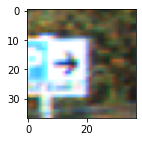

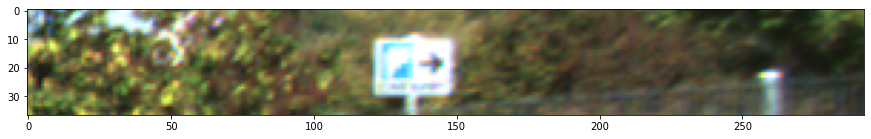

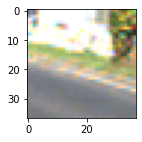

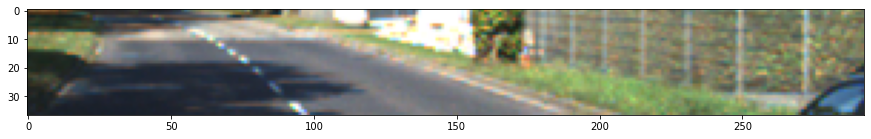

In [ ]:
def display_train_patches(idx):
    left_patch, right_strip_patch, labels = train_dataset[idx]

    plt.figure(figsize=(2, 2))
    plt.imshow(left_patch)
    plt.show()

    plt.figure(figsize=(15, 15))
    plt.imshow(right_strip_patch)
    plt.show()

display_train_patches(0)
display_train_patches(10000)

## Модель

Общая схема работы метода:
1. Вырезаем патч из левого изображения и полоску из правого
2. Применяем к полученным фрагментам свёрточную нейросеть:
 * для патча получаем тензор признаков $F_{patch}$ размера $C\times 1\times 1$
 * для полоски получаем тензор $F_{strip}$ размера $C\times 1\times W_{strip}$
 * $C$ — количество каналов на выходе модели, можно задать произвольное число
3. Скалярно перемножаем признаки по каналам, т.е. вычисляем «‎схожесть» патча со всеми возможными патчами в полоске: $$correlation[i] = \langle F_{patch}, F_{strip}[:, :, i]\rangle\quad i=0,\ldots,W_{strip}-1$$
4. Преобразуем действительные числа в вероятности с помощью softmax
5. При обучении вычисляем функцию ошибки (бинарную кросс-энтропию) и выполняем шаг градиентного спуска

<img src="https://drive.google.com/uc?id=1D0G3G06mJhrB6FvAPuSQXFQSe04Uyknf" height="500">

**Задание 2**.

Реализуйте нейросетевую архитектуру вида

* conv(kernel_size=5, channels=4) $\times$ 4
* conv(kernel_size=5, channels=8) $\times$ 5

После каждого сверточного слоя [(Conv2d)](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html) идет BatchNorm и ReLU. На последнем слое применять ReLU не нужно.






In [ ]:
class PatchModel(nn.Module):
    def __init__(self, input_channels=3):
        super().__init__()
        c1 = 4
        c2 = 8
        c3 = 16

        self.conv_layers = nn.Sequential(
            # your code here
            # vvvvvvvvvvvvvv
            self._conv(input_channels, c1, 5),
            self._conv(c1, c1, 5),
            self._conv(c1, c1, 5),
            self._conv(c1, c2, 5),
            self._conv(c2, c2, 5),
            self._conv(c2, c2, 5),
            self._conv(c2, c3, 5),
            self._conv(c3, c3, 5),
            self._conv(c3, c3, 5, relu=False),
            # ^^^^^^^^^^^^^^
        )

    def __call__(self, x):
        out = self.conv_layers(x)
        return out

    def _conv(self, in_channels, out_channels, kernel_size, relu=True):
        block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=0),
            nn.BatchNorm2d(out_channels)
        )
        if relu:
            block.add_module("relu", nn.ReLU())

        return block

Проверим, что модель работает, и размер выходных тензоров правильный.

In [ ]:
model = PatchModel()
input = torch.rand(4, 3, 37, 37).float()  # shape=(b c h w)
features = model(input)
print(features.shape)  # must be (4, 8, 1, 1)

torch.Size([4, 16, 1, 1])


## Операции над тензорами

Для обучения модели в PyTorch создается цикл, в котором будет выполняться:
* загрузка обучающих примеров
* вычисление предсказания модели
* вычисление функции потерь
* обратное распространение ошибки
* логирование значений ошибки

Перед этим поработаем с тензорными функциями. По аналогии с NumPy, они работают гораздо быстрее питоновского кода. Они выполняются на GPU, если тензоры были перемещены в видеопамять.

**Задание 3**.

Предположим, модель вычислила признаки для патча и полоски. Реализуйте вычисление скалярного произведения: $$correlation[i] = \langle F_{patch}, F_{strip}[:, :, i]\rangle\quad i=0,\ldots,W_{strip}-1$$

Примените функцию [torch.sum](https://pytorch.org/docs/stable/generated/torch.sum.html) с аргументом dim. Также здесь поможет [broadcasting](https://numpy.org/doc/stable/user/basics.broadcasting.html). Для проверки результата сделаны тестовые тензоры. **Не используйте циклы, только операции над тензорами PyTorch!**

In [ ]:
torch.manual_seed(0)
patch_feat = (torch.rand(2, 1, 1)*3+1).int().float() # shape=(c 1 1)
strip_feat = (torch.rand(2, 1, 3)*3+1).int().float() # shape=(c 1 w)
print(patch_feat)
print(strip_feat)

# your code here
# vvvvvvvvvvvvvv

# https://stackoverflow.com/questions/61875963/pytorch-row-wise-dot-product
inner_prod = torch.sum(patch_feat * strip_feat, dim=0) # broadcasting in multiply. shape=(1 w)
print(inner_prod, inner_prod.shape)
ans = inner_prod


true_ans = torch.tensor([[ 8.,  8., 11.]])
assert(torch.sum(ans - true_ans) < 0.0001)

tensor([[[2.]],

        [[3.]]])
tensor([[[1., 1., 1.]],

        [[2., 2., 3.]]])
tensor([[ 8.,  8., 11.]]) torch.Size([1, 3])


В реальности в модель подается **мини-батч** из $B$ обучающих примеров, поэтому добавляется еще одно измерение. Вычислим скалярное произведение и для этого случая.

In [ ]:
torch.manual_seed(0)
patch_feat = (torch.rand(2, 2, 1, 1)*3+1).int().float() # shape=(b c 1 1)
strip_feat = (torch.rand(2, 2, 1, 3)*3+1).int().float() # shape=(b c 1 w)
print(patch_feat)
print(strip_feat)

# your code here
# vvvvvvvvvvvvvv

# https://stackoverflow.com/questions/61875963/pytorch-row-wise-dot-product
inner_prod = torch.sum(patch_feat * strip_feat, dim=1) # broadcasting in multiply. shape=(b 1 w)
print(inner_prod, inner_prod.shape)
ans = inner_prod


true_ans = torch.tensor([[[11., 10., 10.]],
                         [[ 3.,  3.,  3.]]])
assert(torch.sum(ans - true_ans) < 0.0001)

tensor([[[[2.]],

         [[3.]]],


        [[[1.]],

         [[1.]]]])
tensor([[[[1., 2., 2.]],

         [[3., 2., 2.]]],


        [[[2., 2., 1.]],

         [[1., 1., 2.]]]])
tensor([[[11., 10., 10.]],

        [[ 3.,  3.,  3.]]]) torch.Size([2, 1, 3])


Осталось применить [softmax](https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html) вдоль последнего измерения $W$ и посчитать функцию ошибки — [бинарную кросс-энтропию](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html).

In [ ]:
torch.manual_seed(0)
inner_prod = (torch.rand(2, 3)*4).int().float()/4  # dot product, shape=(b w)
labels = (torch.rand(2, 3)*4).int().float()/4  # ground truth probability

# your code here
# vvvvvvvvvvvvvv

softmax = nn.Softmax(dim=-1)
binary_cross_entropy = nn.BCELoss()

target = softmax(inner_prod) # applies softmax by last dimension
# target = target * (1 - eps * 2) + eps # do not allow too high loss
print(target, target.shape)
print(labels, labels.shape)

target_view = target.view(-1).float()
labels_view = labels.view(-1).float()

loss = binary_cross_entropy(target_view, labels_view)
print(loss)
ans = loss


true_ans = 0.6460
assert(ans - true_ans < 0.0001)

tensor([[0.2918, 0.4810, 0.2272],
        [0.2543, 0.3265, 0.4192]]) torch.Size([2, 3])
tensor([[0.2500, 0.7500, 0.2500],
        [0.5000, 0.2500, 0.2500]]) torch.Size([2, 3])
tensor(0.6460)


## Обучение модели

In [ ]:
DEVICE = "cuda" # "cpu" or "cuda"
PRINT_FREQ = 50 # how frequently to print training status
VAL_FREQ = 250 # how frequently to run validation

Логируем функцию ошибки (а логировать можно все что угодно) в TensorBoard. Этот формат логов был создан в фреймворке TensorFlow, но PyTorch тоже его поддерживает.

In [ ]:
from torch.utils.tensorboard import SummaryWriter

class Logger:
    def __init__(self, path='runs/logbook', total_steps=0):
        self.total_steps = total_steps
        self.running_loss = {}
        self.writer = None
        self.writer_path = path

    def _print_training_status(self):
        # write average values to tensorboard
        if self.writer is None:
            self.writer = SummaryWriter(self.writer_path)
        for key in self.running_loss:
            self.writer.add_scalar(key, self.running_loss[key]/PRINT_FREQ, self.total_steps)
            self.running_loss[key] = 0.0

    def push(self, metrics):
        # sum new metric values for averaging
        self.total_steps += 1

        for key in metrics:
            if key not in self.running_loss:
                self.running_loss[key] = 0.0
            self.running_loss[key] += metrics[key]

        if self.total_steps % PRINT_FREQ == PRINT_FREQ - 1:
            self._print_training_status()
            self.running_loss = {}

    def write_dict(self, results):
        # write values to tensorboard without averaging
        if self.writer is None:
            self.writer = SummaryWriter(self.writer_path)
        for key in results:
            self.writer.add_scalar(key, results[key], self.total_steps)

    def close(self):
        self.writer.close()

**Задание 4.**

Добавьте в цикл применение модели и вычисление функции ошибки. Обучите в течении 500 итераций. Попробуйте обучать с разными параметрами batch size, learning rate.

Для тестирования удобно положить train_steps=1, batch_size=2, num_workers=1.

*Замечание*. Обратите внимание, что бинарная кросс-энтропия стремится к бесконечности при максимальной разнице между предсказанием и GT. Это порождает численную нестабильность, и обучение может не сходиться. Чтобы этого избежать, попробуйте сузить диапазон вероятностей $[0,1] → [\varepsilon, 1-\varepsilon],\ \varepsilon>0$.

In [ ]:
# -----------------------------------
# TO BE REMOVED

def evaluate_model(model, left_img, right_img):
    """
    Args:
        left_img, right_img: image arrays with shape (h, w, c), values in range [0.0, 1.0]
    Returns:
        numpy array with shape (h, w)
    """

    out_img = None
    with torch.no_grad():
        left_img_cuda = torch.tensor(left_img).float().to(DEVICE).permute(2, 0, 1).unsqueeze(dim=0)
        right_img_cuda = torch.tensor(right_img).float().to(DEVICE).permute(2, 0, 1).unsqueeze(dim=0)

        # your code here
        # vvvvvvvvvvvvvv
        lfeat = model(left_img_cuda)[0] # b c h w -> c h w
        rfeat = model(right_img_cuda)[0]
        # efficient computation of pairwise dot product
        feat_w = lfeat.shape[-1]
        coor_matrix = torch.arange(feat_w).float().to(DEVICE)
        a = lfeat.permute(1, 2, 0) # c h w -> h w c
        bt = rfeat.permute(1, 0, 2) # c h w -> h c w
        cost = torch.bmm(a, bt) # h w w
        disparity = torch.abs(torch.argmax(cost, dim=-1).float() - coor_matrix) # argmax result: h w. broadcasting applied
        # ^^^^^^^^^^^^^^
        out_img = disparity.cpu().numpy()
    return out_img

def get_data_images(idx):
    left_img = imread(left_image_paths[idx]).astype(np.float64) / 255.0
    right_img = imread(right_image_paths[idx]).astype(np.float64) / 255.0
    disp_img = imread(disparity_image_paths[idx], as_gray=True).astype(np.float64) / 256.0
    return left_img, right_img, disp_img

def evaluate_model_pad(model, left_img, right_img, half_patch_size):
    # left_img, right_img: image arrays with shape (h, w, c), values in range [0.0, 1.0]

    p = half_patch_size
    left_img = np.pad(left_img, ((p, p), (p, p), (0, 0)))
    right_img = np.pad(right_img, ((p, p), (p, p), (0, 0)))
    out_img = evaluate_model(model, left_img, right_img)
    return out_img

def calc_d1all_err(prediction, gt, mask, max_error):
    return ((abs(prediction - gt) >= max_error) * mask).sum() / mask.sum()

def calc_d1all_err_kitti(prediction, gt, max_error):
    return calc_d1all_err(prediction, gt.round().astype("int32"), gt > 0, max_error)

# Calculates the D1-all error for the 'idx'-th image.
def calc_error(idx):
    left_img, right_img, disp_img = get_data_images(idx)

    out_img = evaluate_model_pad(model, left_img, right_img, train_settings.half_patch_size)
    return calc_d1all_err_kitti(out_img, disp_img, 3)

# Makes prediction for the 'idx'-th image pair and shows where it is correct.
def show_error(idx):
    left_img, right_img, disp_img = get_data_images(idx)
    out_img = evaluate_model_pad(model, left_img, right_img, train_settings.half_patch_size)

    mask_gt_exists = disp_img > 0
    mask_correct = ((abs(out_img - disp_img).round().astype("int32") < 3) * mask_gt_exists).astype(np.float32)
    mask_incorrect = (1 - mask_correct) * mask_gt_exists

    out_img[out_img > 100] = 0

    plt.figure(figsize=(15, 7))
    plt.title("Посчитанный диспаритет")
    plt.imshow(out_img)
    plt.show()

    plt.figure(figsize=(15, 7))
    plt.title("Карта ошибок (зеленый - верно предсказанные пиксели, красный - неверно)")
    plt.imshow(left_img)
    plt.imshow(np.stack([mask_incorrect, mask_correct, np.zeros(mask_correct.shape)], axis=2), alpha=0.7)
    plt.show()


In [ ]:
import time
import datetime as dt

def calc_validation_score():
    model.train(False)
    errors = []
    for image_id in val_image_ids:
        errors.append(calc_error(image_id))
    model.train(True)
    return np.mean(np.array(errors))

def train(model, train_dl, optimizer, logger, visualize_list, train_steps):
    """
    Main training loop. Load training data, run model forward and backward pass,
    print training status, run validation.
    """
    start = time.time()
    model.to(DEVICE)

    softmax = nn.Softmax(dim=-1)
    eps = torch.tensor(0.0001).to(DEVICE)
    binary_cross_entropy = nn.BCELoss(reduction="sum")

    print("Training steps:", train_steps)

    while True:
        model.train(True)  # set training mode
        dataloader = train_dl
        step = 0
        ema_loss = 0.0
        start_time = time.time()

        # iterate over data
        for left_patch, right_strip, labels in dataloader:
            step += 1

            # moving tensors to GPU
            # tensor shape b h w c -> b c h w
            left_patch = left_patch.to(DEVICE).permute(0, 3, 1, 2).float().contiguous() # contiguous speeds up 2-4x
            right_strip = right_strip.to(DEVICE).permute(0, 3, 1, 2).float().contiguous()
            labels = labels.to(DEVICE).contiguous() # shape=(b w)

            # forward pass
            optimizer.zero_grad()

            # Run model on left_patch, right_strip. Compute loss with labels.

            # your code here
            # vvvvvvvvvvvvvv

            patch_feat = model(left_patch) # shape=(b c 1 1)
            strip_feat = model(right_strip) # shape=(b c 1 w)
            inner_prod = torch.sum(patch_feat * strip_feat, dim=1) # broadcasting. shape=(b 1 w)
            inner_prod = torch.squeeze(inner_prod) # remove all dimensions of size 1. shape=(b w)
            target = softmax(inner_prod) # softmax by last dimension
            target = target * (1 - eps * 2) + eps # do not allow too high loss
            target_view = target.view(-1).float() # BCE loss does not allow complex shape
            labels_view = labels.view(-1).float()
            loss = binary_cross_entropy(target_view, labels_view)
            # loss = -torch.sum(labels * torch.log(target + eps) + (1 - labels) * torch.log(1 - target + eps))

            # ^^^^^^^^^^^^^^

            # backward pass
            loss.backward()
            optimizer.step()

            show_loss = loss.detach().cpu().numpy()
            ema_loss = show_loss * (2/(1+step)) + ema_loss * (1-2/(1+step))
            metrics = {
                'cross_entropy_loss': show_loss
            }
            logger.push(metrics)

            if step % PRINT_FREQ == PRINT_FREQ - 1:
                print("step: {}, EMA BCE loss: {:.2f}, step time: {:.2f}".format(step,
                                                                                 ema_loss, (time.time() - start_time) / step))
                left_img = imread(left_image_paths[0]).astype(np.float64) / 255.0
                right_img = imread(right_image_paths[0]).astype(np.float64) / 255.0
                out_img = evaluate_model(model, left_img, right_img)
                visualize_list.append((out_img, step))

            if step % VAL_FREQ == VAL_FREQ - 1:
                val_error = calc_validation_score()
                metrics = {
                    'val_error_percent': val_error
                }
                logger.write_dict(metrics)
                print("validation error: {:.2f}".format(val_error))

            if step > train_steps:
                return

    return train_loss, valid_loss, disp_vis

experiment = dt.datetime.now().strftime("%H%M%S")
logger = Logger(path="runs/logbook-" + experiment)
visualize_list = [] # [(disparity image, steps performed), ...]
model = PatchModel()
print("Parameters:", sum(p.numel() for p in model.parameters()))
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)
train_loader = data.DataLoader(train_dataset, batch_size=128,
        pin_memory=False, shuffle=True, num_workers=2, drop_last=True)

train(model, train_loader, optimizer, logger, visualize_list, train_steps=500)

Parameters: 21352
Training steps: 500
step: 49, EMA BCE loss: 796.31, step time: 0.31
step: 99, EMA BCE loss: 747.49, step time: 0.28
step: 149, EMA BCE loss: 676.49, step time: 0.27
step: 199, EMA BCE loss: 628.31, step time: 0.26
step: 249, EMA BCE loss: 596.42, step time: 0.26
validation error: 0.51
step: 299, EMA BCE loss: 574.71, step time: 0.29
step: 349, EMA BCE loss: 560.42, step time: 0.28
step: 399, EMA BCE loss: 547.16, step time: 0.28
step: 449, EMA BCE loss: 536.79, step time: 0.27
step: 499, EMA BCE loss: 528.83, step time: 0.27
validation error: 0.39


Построим интерактивный график функции ошибки в TensorBoard. Если график не показывается, нажмите круглую стрелку в правом верхнем углу.

In [ ]:
logger.close()
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
#!rm -r runs

## Тестирование на изображениях

**Задание 5**.

Наша модель работает только с отдельными патчами и полосками. Чтобы вычислить диспаритет для всех пикселей в изображении, можно вычислить признаки для каждого из кадров за **один** проход модели, потом посчитать попарные скалярные произведения между признаками в одной строке и взять индекс максимума.

* $F_{left}$ — признаки левого ракурса стереопары размера $(H, C, W)$, последние два измерения поменяли местами
* $F_{right}$ — признаки правого ракурса стереопары размера $(H, W, C)$
* $correlation$ — попарные скалярные произведения признаков размера $(H, W, W)$
* $disparity$ — карта диспаритета размера $(H, W)$

$$correlation[h, j, i] = \langle F_{left}[h, :, i], F_{right}[h, j] \rangle$$
$$h=0,\ldots, H-1;\quad i=0,\ldots, W-1;\quad j=0,\ldots, W-1$$
$$ $$

$$disparity[h,w] = \underset{i}{\operatorname{argmax}} correlation[h, i, w]$$
$$h=0,\ldots, H-1;\quad w=0,\ldots, W-1;\quad i=0,\ldots, W-1$$

<img src="https://drive.google.com/uc?id=18vAw5BKvrA3vOui8LHrcLLir3ae5W3Ph" >

Нетрудно видеть, что для заданного $h$ нужно по сути перемножить матрицы. Поэтому здесь удобно применить [torch.bmm](https://pytorch.org/docs/stable/generated/torch.bmm.html). Перед этим нужно поменять порядок измерений с помощью [torch.permute](https://pytorch.org/docs/stable/generated/torch.permute.html). Заметьте, при тестировании не нужно брать softmax по горизонтали, так как на расположение максимума эта операция не повлияет.

Вычислите карту диспаритета по предложенному алгоритму.

In [ ]:
torch.manual_seed(5)
fleft = (torch.rand(2, 2, 3)*3+1).int().float() # shape=(h w c)
fright = (torch.rand(2, 2, 3)*3+1).int().float() # shape=(h w c)


# your code here
# vvvvvvvvvvvvvv
print(fleft)
fright = fright.permute(0, 2, 1)
print(fright)
cost = torch.bmm(fleft, fright)
disp = torch.argmax(cost, dim=-1)
print(cost, cost.shape)
print(disp)
ans = disp


true_ans = torch.tensor([[1, 1], [0, 0]])
assert(torch.sum(ans - true_ans) < 0.0001)

tensor([[[3., 1., 3.],
         [3., 3., 1.]],

        [[1., 3., 1.],
         [3., 2., 2.]]])
tensor([[[1., 2.],
         [2., 3.],
         [3., 2.]],

        [[1., 1.],
         [3., 1.],
         [3., 3.]]])
tensor([[[14., 15.],
         [12., 17.]],

        [[13.,  7.],
         [15., 11.]]]) torch.Size([2, 2, 2])
tensor([[1, 1],
        [0, 0]])


Теперь применим этот алгоритм на настоящих изображениях. При реализации стоит помнить, что диспаритет — это смещение пикселя в правом ракурсе относительно его положения в левом ракурсе.

In [ ]:
def evaluate_model(model, left_img, right_img):
    """
    Args:
        left_img, right_img: image arrays with shape (h, w, c), values in range [0.0, 1.0]
    Returns:
        numpy array with shape (h, w)
    """

    out_img = None
    with torch.no_grad():
        left_img_cuda = torch.tensor(left_img).float().to(DEVICE).permute(2, 0, 1).unsqueeze(dim=0)
        right_img_cuda = torch.tensor(right_img).float().to(DEVICE).permute(2, 0, 1).unsqueeze(dim=0)

        # your code here
        # vvvvvvvvvvvvvv
        lfeat = model(left_img_cuda)[0] # b c h w -> c h w
        rfeat = model(right_img_cuda)[0]
        # efficient computation of pairwise dot product
        feat_w = lfeat.shape[-1]
        coor_matrix = torch.arange(feat_w).float().to(DEVICE)
        a = lfeat.permute(1, 2, 0) # c h w -> h w c
        bt = rfeat.permute(1, 0, 2) # c h w -> h c w
        cost = torch.bmm(a, bt) # h w w
        disparity = torch.abs(torch.argmax(cost, dim=-1).float() - coor_matrix) # argmax result: h w. broadcasting applied
        # ^^^^^^^^^^^^^^
        out_img = disparity.cpu().numpy()
    return out_img

Визуализируем посчитанный диспаритет и истинные значения.

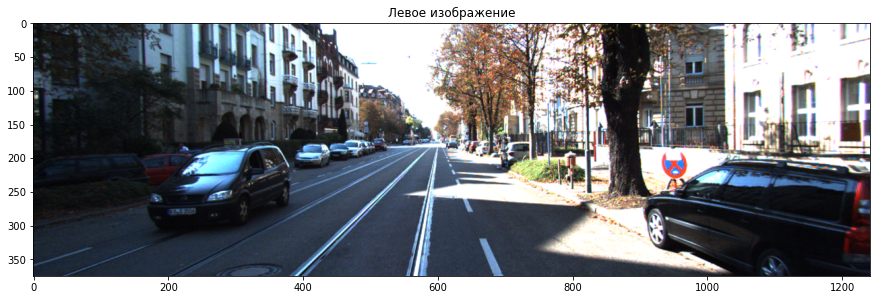

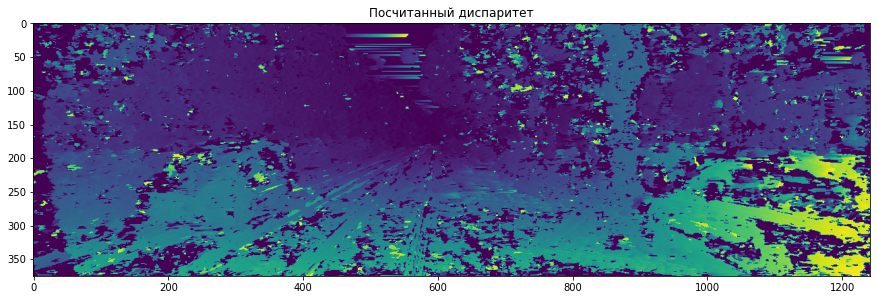

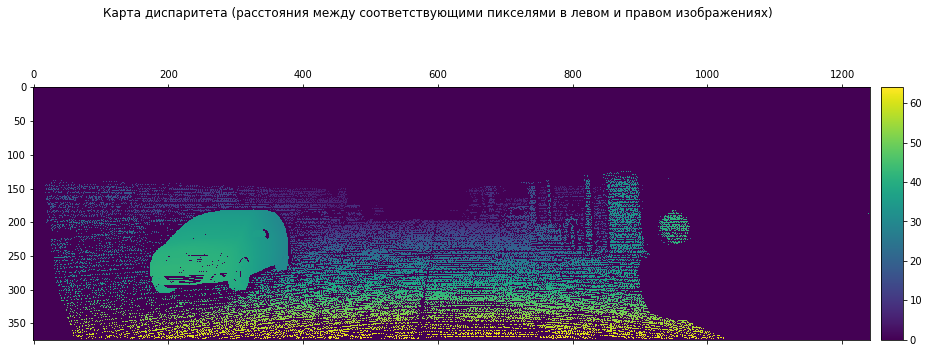

In [ ]:
def get_data_images(idx):
    left_img = imread(left_image_paths[idx]).astype(np.float64) / 255.0
    right_img = imread(right_image_paths[idx]).astype(np.float64) / 255.0
    disp_img = imread(disparity_image_paths[idx], as_gray=True).astype(np.float64) / 256.0
    return left_img, right_img, disp_img

def evaluate_model_pad(model, left_img, right_img, half_patch_size):
    # left_img, right_img: image arrays with shape (h, w, c), values in range [0.0, 1.0]

    p = half_patch_size
    left_img = np.pad(left_img, ((p, p), (p, p), (0, 0)))
    right_img = np.pad(right_img, ((p, p), (p, p), (0, 0)))
    out_img = evaluate_model(model, left_img, right_img)
    return out_img

# Makes prediction for the 'idx'-th image pair and shows it.
def display_prediction_ext(idx):
    left_img, right_img, disp_img = get_data_images(idx)
    out_img = evaluate_model_pad(model, left_img, right_img, train_settings.half_patch_size)
    out_img[out_img > 100] = 0

    plt.figure(figsize=(15, 7))
    plt.title("Левое изображение")
    plt.imshow(left_img)
    plt.show()

    plt.figure(figsize=(15, 7))
    plt.title("Посчитанный диспаритет")
    plt.imshow(out_img)
    plt.show()

    fig = plt.figure(figsize=(15, 6))
    fig.suptitle("Карта диспаритета (расстояния между соответствующими пикселями в левом и правом изображениях)")
    ax = plt.axes()
    im = ax.matshow(disp_img)
    cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
    plt.colorbar(im, cax=cax)
    plt.show()

display_prediction_ext(0)

Чтобы численно оценить качество карты диспаритета применяют так называемую [«‎D1-all» метрику](http://www.cvlibs.net/datasets/kitti/eval_scene_flow.php?benchmark=stereo), которая показывает процент пикселей, в которых вычисленное значение диспаритета отличается от истинного на 3 или более пикселя.

In [ ]:
def calc_d1all_err(prediction, gt, mask, max_error):
    return ((abs(prediction - gt) >= max_error) * mask).sum() / mask.sum()

def calc_d1all_err_kitti(prediction, gt, max_error):
    return calc_d1all_err(prediction, gt.round().astype("int32"), gt > 0, max_error)

# Calculates the D1-all error for the 'idx'-th image.
def calc_error(idx):
    left_img, right_img, disp_img = get_data_images(idx)

    out_img = evaluate_model_pad(model, left_img, right_img, train_settings.half_patch_size)
    return calc_d1all_err_kitti(out_img, disp_img, 3)

# Makes prediction for the 'idx'-th image pair and shows where it is correct.
def show_error(idx):
    left_img, right_img, disp_img = get_data_images(idx)
    out_img = evaluate_model_pad(model, left_img, right_img, train_settings.half_patch_size)

    mask_gt_exists = disp_img > 0
    mask_correct = ((abs(out_img - disp_img).round().astype("int32") < 3) * mask_gt_exists).astype(np.float32)
    mask_incorrect = (1 - mask_correct) * mask_gt_exists

    out_img[out_img > 100] = 0

    plt.figure(figsize=(15, 7))
    plt.title("Посчитанный диспаритет")
    plt.imshow(out_img)
    plt.show()

    plt.figure(figsize=(15, 7))
    plt.title("Карта ошибок (зеленый - верно предсказанные пиксели, красный - неверно)")
    plt.imshow(left_img)
    plt.imshow(np.stack([mask_incorrect, mask_correct, np.zeros(mask_correct.shape)], axis=2), alpha=0.7)
    plt.show()

Посмотрим, на каких примерах модель работает хуже всего.

Erroneous pixels (%): 48.8


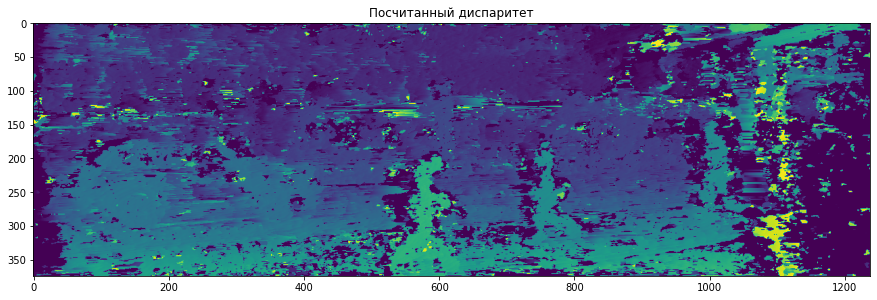

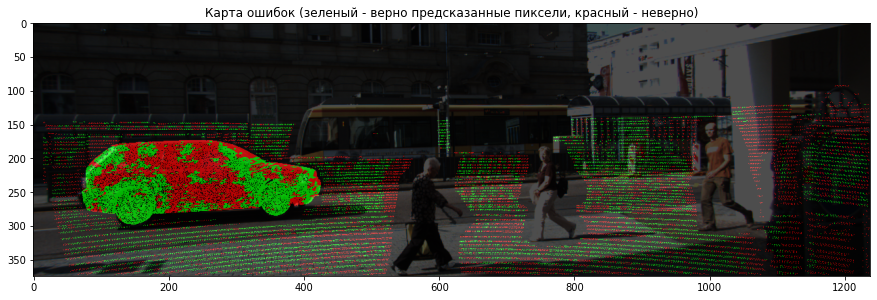

Erroneous pixels (%): 52.3


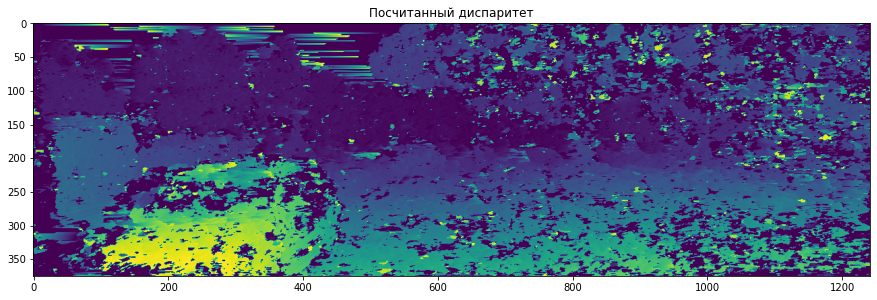

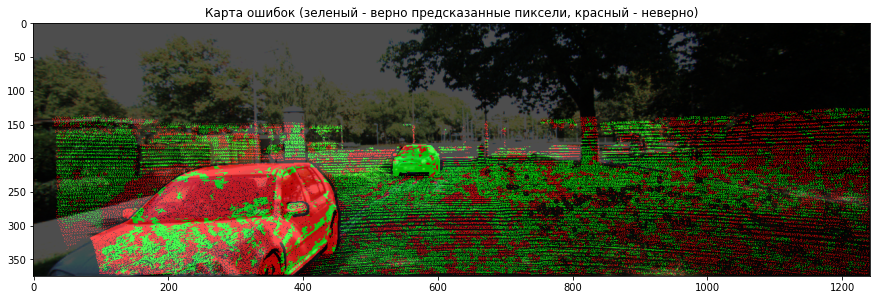

In [ ]:
np.random.seed(42)

check_cnt = 20
check_image_ids = np.random.choice(val_image_ids, check_cnt, replace=False)
errors = list(map(calc_error, check_image_ids))

# Show the most erroneous examples.
example_cnt = 2
for i in np.argpartition(errors, check_cnt - example_cnt)[-example_cnt:]:
    print(f"Erroneous pixels (%): {errors[i] * 100:.1f}")
    show_error(check_image_ids[i])

Раскомментируйте валидацию и визуализацию примеров в цикле обучения. Посмотрим на результат после разного количества шагов обучения.


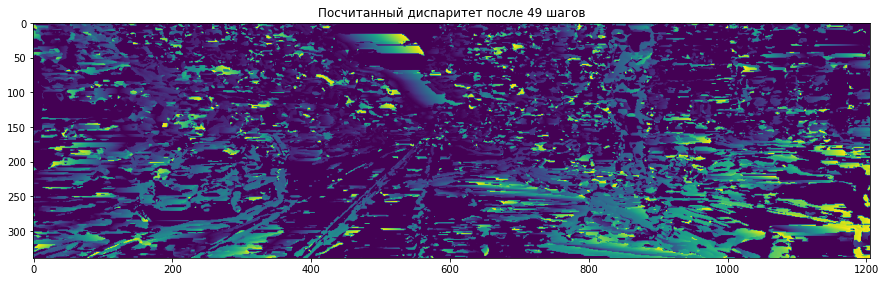

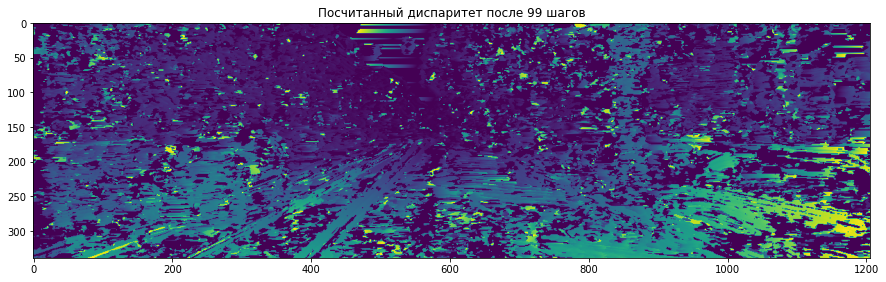

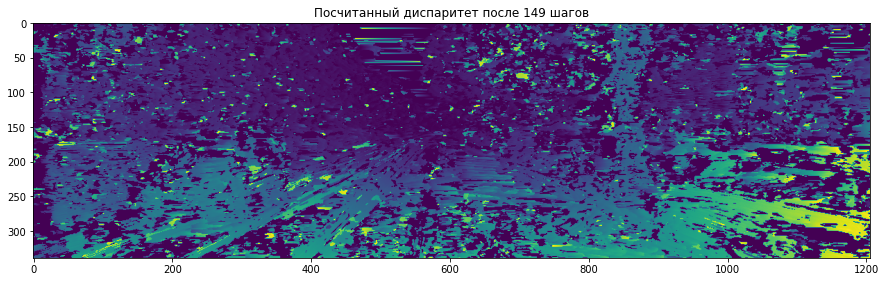

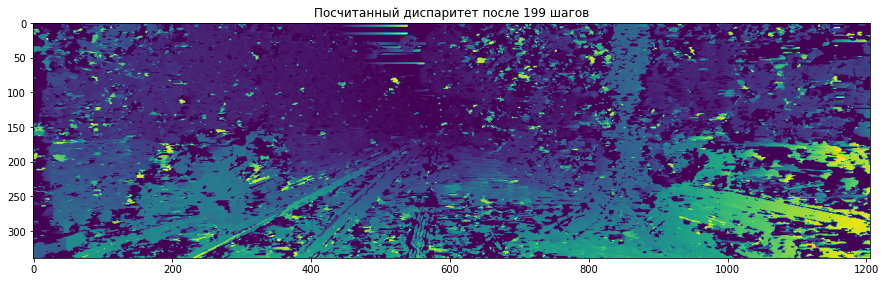

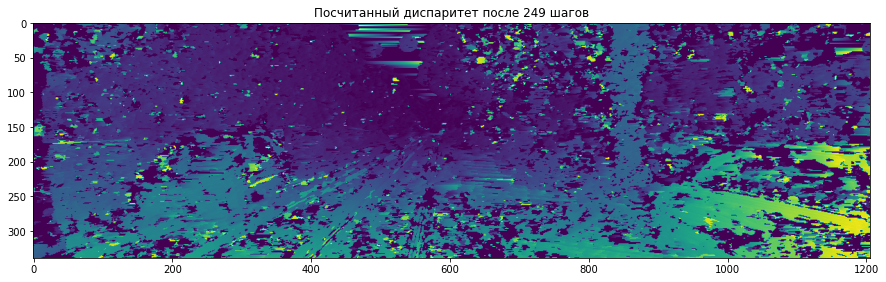

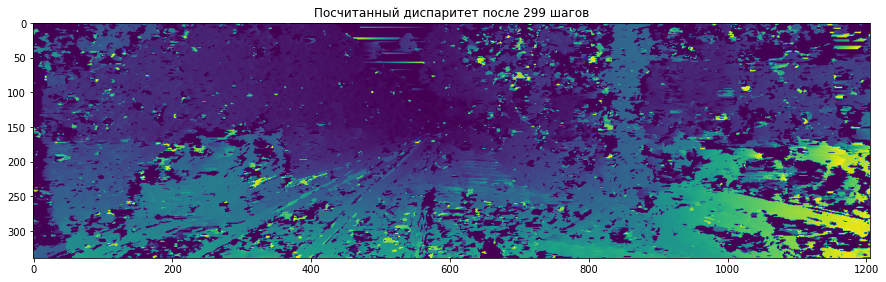

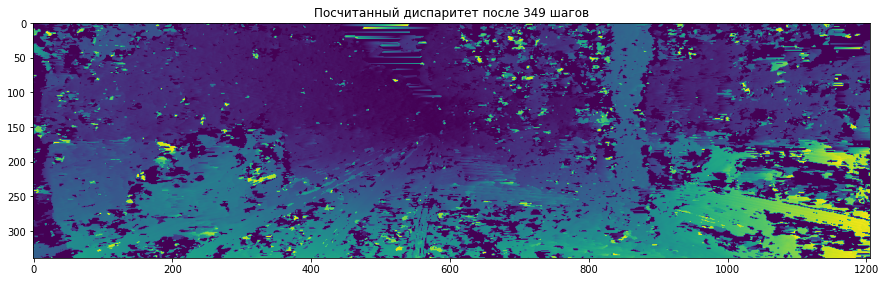

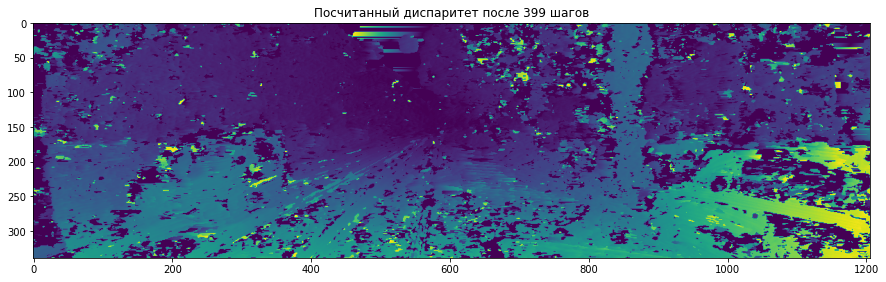

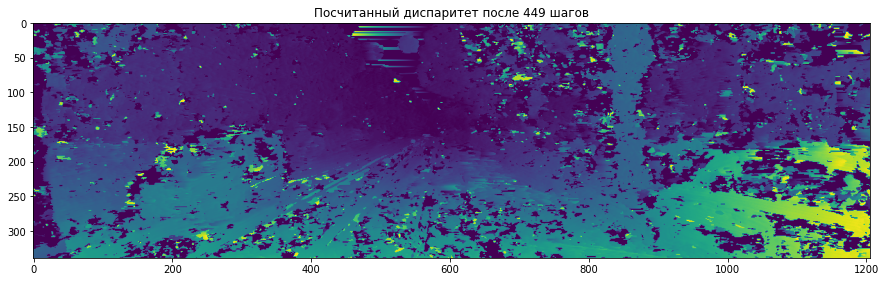

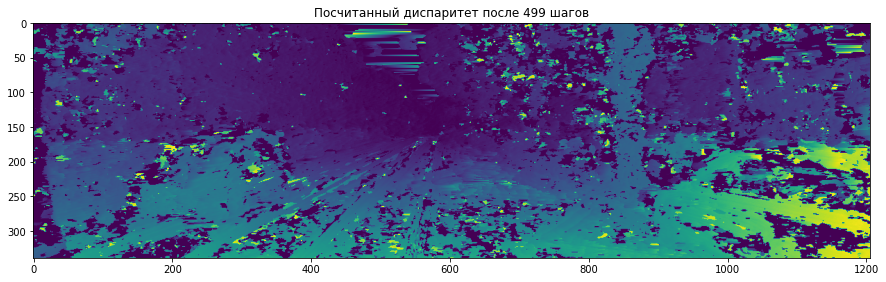

In [ ]:
def display_prediction(vis_idx):
    out_img, steps_performed = visualize_list[vis_idx]
    out_img[out_img > 100] = 0

    plt.figure(figsize=(15, 7))
    plt.title("Посчитанный диспаритет после {} шагов".format(steps_performed))
    plt.imshow(out_img)
    plt.show()

for i in range(0, len(visualize_list)):
    display_prediction(i)

## Аугментация

**Задание 6**.

В задачах Computer Vision применяют аугментацию для улучшения «‎обобщающей способности» нейросети. При этом качество при обучении может ухудшится, но при валидации или тестировании на других данных оно возрастет. Есть [много библиотек](https://towardsdatascience.com/getting-started-with-albumentation-winning-deep-learning-image-augmentation-technique-in-pytorch-47aaba0ee3f8) для автоматической аугментации. Воспользуемся torchvision — дополнением PyTorch. Есть [список функций](https://pytorch.org/vision/master/transforms.html) и [визуализации](https://pytorch.org/vision/master/auto_examples/plot_transforms.html). В нашей задаче удобно использовать только цветовые искажения: ColorJitter, GaussianBlur.

Реализуйте аугментацию входных изображений в ячейке ниже, добавьте ее в класс датасета KittiDataset.getitem, обучите модель.

torch.Size([37, 37, 3])


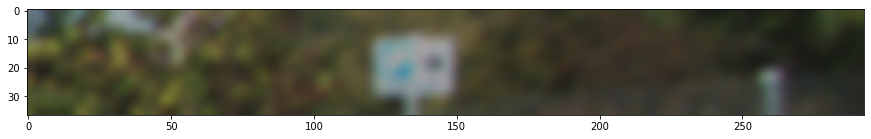

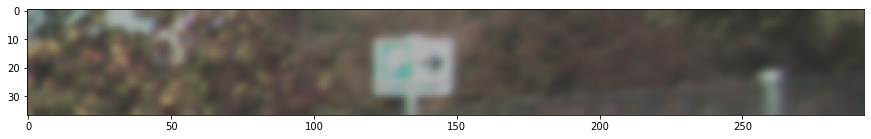

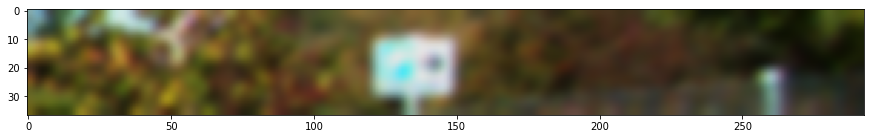

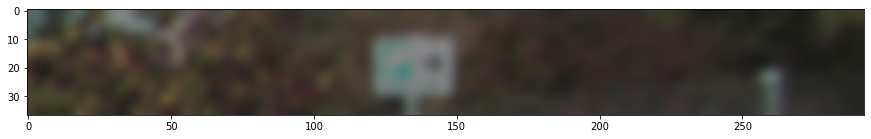

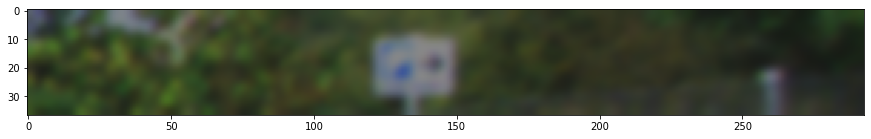

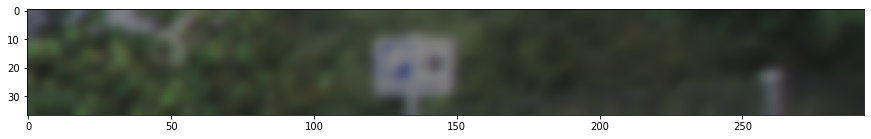

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


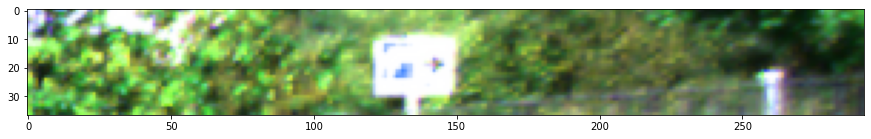

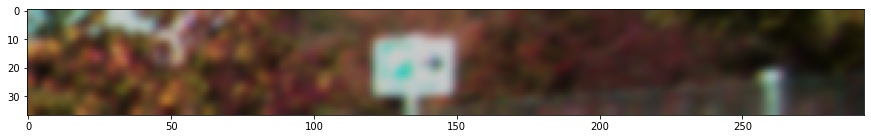

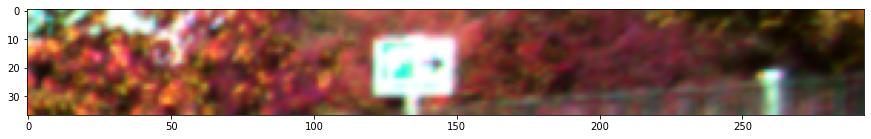

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


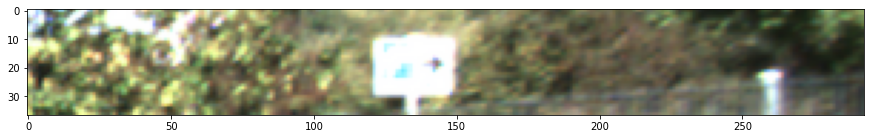

In [ ]:
import torchvision.transforms as T

torch.manual_seed(0)

def display_train_patches(idx):
    left_patch, right_strip_patch, labels = train_dataset[idx]
    print(left_patch.shape)

    for i in range(10):
        t = torch.clone(right_strip_patch.permute(2, 0, 1))

        # your code here
        # vvvvvvvvvvvvvv
        photo_aug = T.Compose([
                   T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.5/3.14),
                   T.GaussianBlur(7)
        ])
        t = photo_aug(t)
        # ^^^^^^^^^^^^^^

        img = t.permute(1, 2, 0)

        plt.figure(figsize=(15, 15))
        plt.imshow(img)
        plt.show()

display_train_patches(0)